In [4]:
import os
from PIL import Image
import numpy as np

def load_images(folder):
    images = []
    for filename in os.listdir(folder):
        if filename.endswith('.png'):
            img = Image.open(os.path.join(folder, filename))
            img = np.array(img) / 255.0
            images.append(img)
    return np.array(images)

# Load preprocessed images
train_images = load_images('data/preprocessed_train_images')
test_images = load_images('data/preprocessed_test_images')

# Load noisy images
train_images_noisy = load_images('data/noisy_train_images')
test_images_noisy = load_images('data/noisy_test_images')

In [6]:
import tensorflow as tf

In [7]:
encoder = tf.keras.models.Sequential([
    tf.keras.layers.Input(shape=(512, 512, 1)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2), padding='same'),
    tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.MaxPooling2D((2, 2), padding='same')
])

In [8]:
decoder = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    tf.keras.layers.UpSampling2D((2, 2)),
    tf.keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')
])

In [9]:
autoencoder = tf.keras.models.Sequential([encoder, decoder])

In [10]:
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

In [11]:
autoencoder.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 64, 64, 8)      │         6,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (None, 512, 512, 1)    │         6,681 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,785 (49.94 KB)

 Trainable params: 12,785 (49.94 KB)

 Non-trainable params: 0 (0.00 B)

In [15]:
train_images = np.expand_dims(train_images, axis=-1)
test_images = np.expand_dims(test_images, axis=-1)
train_images_noisy = np.expand_dims(train_images_noisy, axis=-1)
test_images_noisy = np.expand_dims(test_images_noisy, axis=-1)

train_size = int(0.1 * len(train_images))
test_size = int(0.1 * len(test_images))

train_images_subset = train_images[:train_size]
train_images_noisy_subset = train_images_noisy[:train_size]
test_images_subset = test_images[:test_size]
test_images_noisy_subset = test_images_noisy[:test_size]

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator()

train_generator = datagen.flow(train_images_noisy_subset, train_images_subset, batch_size=64)

validation_generator = datagen.flow(test_images_noisy_subset, test_images_subset, batch_size=64)

In [18]:
autoencoder.fit(
    train_generator,
    epochs=1,
    validation_data=validation_generator,
    verbose=1,
)

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - loss: 0.1359

C:\Users\kozub\miniconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 69s 6s/step - loss: 0.1338 - val_loss: 0.0494


In [27]:
decoded_imgs = autoencoder.predict(test_images_noisy_subset)

5/5 ━━━━━━━━━━━━━━━━━━━━ 5s 902ms/step


In [20]:
import matplotlib.pyplot as plt

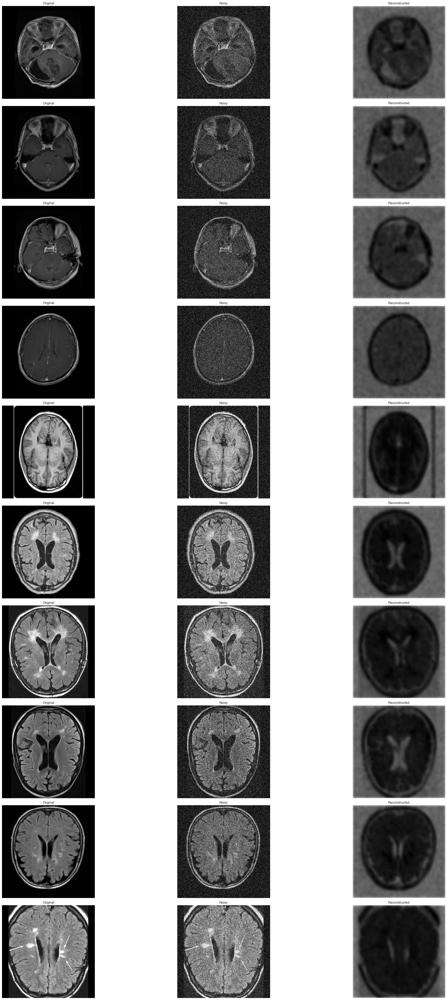

In [28]:
n = 10
plt.figure(figsize=(30, 50))  # Adjust the figure size to make each image larger

for i in range(n):
    # Display original images
    ax = plt.subplot(n, 3, 3 * i + 1)
    plt.imshow(test_images_subset[i].reshape(512, 512), cmap='gray')
    plt.title("Original")
    plt.axis('off')

    # Display noisy images
    ax = plt.subplot(n, 3, 3 * i + 2)
    plt.imshow(test_images_noisy_subset[i].reshape(512, 512), cmap='gray')
    plt.title("Noisy")
    plt.axis('off')

    # Display reconstructed images
    ax = plt.subplot(n, 3, 3 * i + 3)
    plt.imshow(decoded_imgs[i].reshape(512, 512), cmap='gray')
    plt.title("Reconstructed")
    plt.axis('off')

plt.tight_layout()
plt.show()